# Python for Finance - 1 - Return Rate and Risk Analysis

* Author: Cleiber Garcia
* Date: November/2023

* Goal: I taught myself how to use Python with financial data for making predictions. I put together this notebook while taking an online course called Python para Finanças ('Python for Finance') on Udemy, taught by Jones Granatyr (from IA Expert Academy). This notebook closely mirrors the one covered in class, with the effort I made to infuse my personal touch whenever possible and appropriate. I assure you that I meticulously wrote it line by line.

* Disclaimer: **Please be advised that all forecasts and patterns developed in the course of this training are 
intended solely for educational purposes. Under no circumstances should they be construed as 
investment advice.**

For more information please contact me at cleiber.garcia@gmail.com

# Summary

* [1. Setup](#Setup)
* [2. Load the Working Dataset](#LoadWorkDataSet)
* [3. Visualization](#Visualization)
* [4. Another Stock Portfolio](#AnotherStockPortfolio)
* [5. Return Rates](#ReturnRates)
* [6. Calculating the Return for the Stock Portfolio (GOL, CVC, WEGE, MGLU, 
TOTS)](#Portfolio1)
* [7. Calculating the Return for the Stock Portfolio (AMBEV, ODONTOPREV, VIVO, PETROBRAS, BBRASIL)](#Portfolio2)
* [8. Risk Analysis](#RiskAnalysis)
* [9. Analysing the Risk of a Portfolio](#AnaRiskPortfolio)
* [10. Systematic and non-Systematic Risk](#SystemRiskAndNonSystemRisk)
* [11. Analysing Portfolio AMBEV, ODONTOPREV, VIVO, PETROBRAS, BBRASIL, BOVA](#PorfolioExerc)

# 1. Set up <a id='Setup'></a>

## 1.1 Installing Python Modules

In [2]:
!pip install yfinance

In [1]:
!pip install pandas_datareader

## 1.2 Import Python Modules

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
import plotly.express as px

In [4]:
from pandas_datareader import data

In [5]:
import yfinance as yf

# 2. Load the Working Dataset <a id='LoadWorkDataSet'></a>

[Summary](#Summary)

## 2.1 Load 'GOLL4.SA'

In [6]:
gol_df = yf.download("GOLL4.SA", start='2015-01-01')

[*********************100%%**********************]  1 of 1 completed


In [7]:
gol_df

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2015-01-02,14.97,15.20,14.61,14.99,14.99,901900
2015-01-05,14.90,15.01,14.41,14.85,14.85,1272500
2015-01-06,14.75,15.21,14.65,15.21,15.21,2183500
2015-01-07,15.15,15.33,14.55,14.55,14.55,1846900
2015-01-08,14.41,14.65,14.20,14.27,14.27,1569500
...,...,...,...,...,...,...
2023-11-08,8.05,8.30,7.97,8.07,8.07,12375900
2023-11-09,8.14,8.59,8.13,8.33,8.33,12406900
2023-11-10,8.41,8.77,8.40,8.74,8.74,15687500


In [8]:
gol_df.shape

(2206, 6)

In [9]:
gol_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2206 entries, 2015-01-02 to 2023-11-14
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Open       2206 non-null   float64
 1   High       2206 non-null   float64
 2   Low        2206 non-null   float64
 3   Close      2206 non-null   float64
 4   Adj Close  2206 non-null   float64
 5   Volume     2206 non-null   int64  
dtypes: float64(5), int64(1)
memory usage: 120.6 KB


In [10]:
gol_df.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2015-01-02,14.97,15.20,14.61,14.99,14.99,901900
2015-01-05,14.90,15.01,14.41,14.85,14.85,1272500
2015-01-06,14.75,15.21,14.65,15.21,15.21,2183500
2015-01-07,15.15,15.33,14.55,14.55,14.55,1846900
2015-01-08,14.41,14.65,14.20,14.27,14.27,1569500


In [11]:
gol_df.tail()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2023-11-08,8.05,8.30,7.97,8.07,8.07,12375900
2023-11-09,8.14,8.59,8.13,8.33,8.33,12406900
2023-11-10,8.41,8.77,8.40,8.74,8.74,15687500
2023-11-13,8.74,8.86,8.63,8.74,8.74,7733300
2023-11-14,8.77,8.86,8.77,8.85,8.85,445300


In [12]:
gol_df.describe()

,Open,High,Low,Close,Adj Close,Volume
count,2206.000000,2206.000000,2206.000000,2206.000000,2206.000000,2.206000e+03
mean,14.619846,14.983209,14.237924,14.583921,14.583921,6.383607e+06
std,9.152488,9.320584,8.974047,9.143491,9.143491,5.687978e+06
min,1.160000,1.180000,1.130000,1.160000,1.160000,0.000000e+00
25%,7.630000,7.790000,7.400000,7.612500,7.612500,2.320500e+06
50%,12.445000,12.840000,12.000000,12.355000,12.355000,4.709750e+06
75%,20.299999,20.897500,19.842500,20.289999,20.289999,8.986725e+06
max,43.669998,44.619999,41.310001,43.790001,43.790001,6.724200e+07


In [13]:
gol_df[gol_df['Close'] >= 43.79]

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-08-01,41.25,44.619999,41.25,43.790001,43.790001,6664200


In [14]:
# Salvar em arquivo .csv

In [15]:
# Carregar do arquivo .csv

## 2.2 Working with n Stocks: 'GOLL4.SA', 'CVCB3.SA', ...

In [16]:
# Define the list of stocks
acoes = ['GOLL4.SA', 'CVCB3.SA', 'WEGE3.SA', 'MGLU3.SA', 'TOTS3.SA', 'BOVA11.SA']

In [17]:
# Load the list of stocks
acoes_df = pd.DataFrame()
for acao in acoes:
    acoes_df[acao] = yf.download(acao, start='2015-01-01')['Close']

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


In [18]:
# Print the content of acoes_df
acoes_df

,GOLL4.SA,CVCB3.SA,WEGE3.SA,MGLU3.SA,TOTS3.SA,BOVA11.SA
Date,,,,,,
2015-01-02,14.99,15.20,5.923076,0.232812,11.910702,47.259998
2015-01-05,14.85,15.00,5.963461,0.237187,11.544731,46.320000
2015-01-06,15.21,14.80,5.875000,0.234062,10.822770,46.580002
2015-01-07,14.55,14.67,5.807692,0.241875,10.746248,48.150002
2015-01-08,14.27,14.15,5.905769,0.240000,10.995774,48.509998
...,...,...,...,...,...,...
2023-11-08,8.07,3.10,32.450001,1.780000,30.309999,115.519997
2023-11-09,8.33,3.01,32.410000,1.710000,30.980000,115.180000
2023-11-10,8.74,3.04,33.169998,1.800000,31.799999,117.010002


In [19]:
acoes_df = acoes_df.rename(columns={'GOLL4.SA': 'GOL', 'CVCB3.SA': 'CVC', 'WEGE3.SA': 'WEGE',
                                    'MGLU3.SA': 'MGLU', 'TOTS3.SA': 'TOTS', 'BOVA11.SA': 'BOVA'})

In [20]:
acoes_df

,GOL,CVC,WEGE,MGLU,TOTS,BOVA
Date,,,,,,
2015-01-02,14.99,15.20,5.923076,0.232812,11.910702,47.259998
2015-01-05,14.85,15.00,5.963461,0.237187,11.544731,46.320000
2015-01-06,15.21,14.80,5.875000,0.234062,10.822770,46.580002
2015-01-07,14.55,14.67,5.807692,0.241875,10.746248,48.150002
2015-01-08,14.27,14.15,5.905769,0.240000,10.995774,48.509998
...,...,...,...,...,...,...
2023-11-08,8.07,3.10,32.450001,1.780000,30.309999,115.519997
2023-11-09,8.33,3.01,32.410000,1.710000,30.980000,115.180000
2023-11-10,8.74,3.04,33.169998,1.800000,31.799999,117.010002


In [21]:
acoes_df.columns[0:]

Index(['GOL', 'CVC', 'WEGE', 'MGLU', 'TOTS', 'BOVA'], dtype='object')

### Delete null values

In [22]:
# Count the number of null values
acoes_df.isnull().sum()

GOL      0
CVC      0
WEGE     0
MGLU     1
TOTS     0
BOVA    27
dtype: int64

In [23]:
# Backup acoes_df
acoes_df_bkp = acoes_df.copy()

In [24]:
# Delete null values
acoes_df.dropna(inplace=True)

In [25]:
# Count the number of null values
acoes_df.isnull().sum()

GOL     0
CVC     0
WEGE    0
MGLU    0
TOTS    0
BOVA    0
dtype: int64

In [26]:
# Save acoes_df in a file
acoes_df.to_csv('acoes.csv')

In [27]:
# Load the file acoes.csv
acoes_df = pd.read_csv('acoes.csv')
acoes_df

,Date,GOL,CVC,WEGE,MGLU,TOTS,BOVA
0,2015-01-02,14.99,15.20,5.923076,0.232812,11.910702,47.259998
1,2015-01-05,14.85,15.00,5.963461,0.237187,11.544731,46.320000
2,2015-01-06,15.21,14.80,5.875000,0.234062,10.822770,46.580002
3,2015-01-07,14.55,14.67,5.807692,0.241875,10.746248,48.150002
4,2015-01-08,14.27,14.15,5.905769,0.240000,10.995774,48.509998
...,...,...,...,...,...,...,...
2173,2023-11-07,8.05,3.15,32.779999,1.770000,28.690001,115.669998
2174,2023-11-08,8.07,3.10,32.450001,1.780000,30.309999,115.519997
2175,2023-11-09,8.33,3.01,32.410000,1.710000,30.980000,115.180000
2176,2023-11-10,8.74,3.04,33.169998,1.800000,31.799999,117.010002


In [28]:
# Print column name, quantity and type
acoes_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2178 entries, 0 to 2177
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    2178 non-null   object 
 1   GOL     2178 non-null   float64
 2   CVC     2178 non-null   float64
 3   WEGE    2178 non-null   float64
 4   MGLU    2178 non-null   float64
 5   TOTS    2178 non-null   float64
 6   BOVA    2178 non-null   float64
dtypes: float64(6), object(1)
memory usage: 119.2+ KB


In [29]:
# Print the name of the stocks
acoes_df.columns[1:]

Index(['GOL', 'CVC', 'WEGE', 'MGLU', 'TOTS', 'BOVA'], dtype='object')

In [30]:
# Print general statistics
acoes_df.describe()

,GOL,CVC,WEGE,MGLU,TOTS,BOVA
count,2178.000000,2178.000000,2178.000000,2178.000000,2178.000000,2178.000000
mean,14.509793,25.283267,19.115624,6.433687,19.006479,84.496460
std,9.137674,16.929856,13.418185,7.369439,9.467957,24.282986
min,1.160000,2.200000,4.942307,0.030585,7.156402,36.450001
25%,7.600000,13.450000,6.974038,0.718037,10.208103,61.950001
50%,12.235000,19.985000,10.745000,3.675000,14.664394,91.204998
75%,20.207500,40.449999,33.900002,8.971875,28.082500,106.072502
max,43.790001,64.800003,46.105000,27.450001,40.599998,125.750000


# 3. Visualization <a id='Visualization'></a>

[Summary](#Summary)

## 3.1 Histogram of 'GOL'

<Axes: xlabel='GOL', ylabel='Count'>

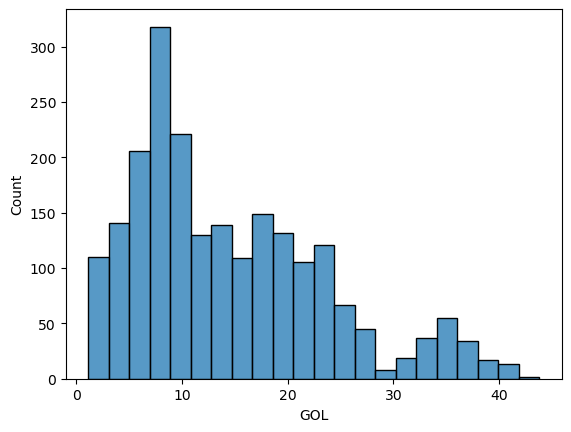

In [31]:
# Visualize histogram of 'GOL'
sns.histplot(acoes_df['GOL'])

## 3.2 Histogram of 'GOL', 'CVC', ...

In [32]:
len(acoes_df.columns)

7

In [33]:
np.arange(1, len(acoes_df.columns))

array([1, 2, 3, 4, 5, 6])

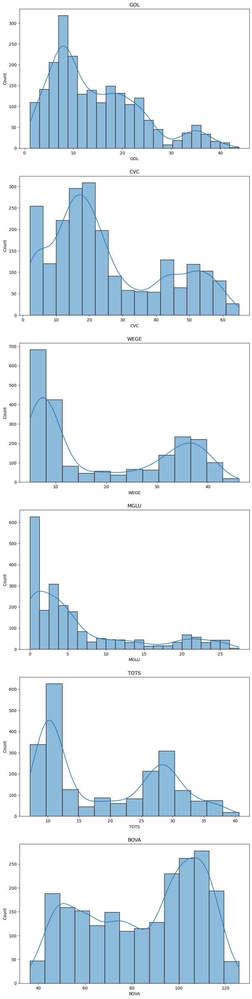

In [34]:
plt.figure(figsize=(10,50))
for i in np.arange(1, len(acoes_df.columns)):
    plt.subplot(7, 1, i+1)
    sns.histplot(acoes_df[acoes_df.columns[i]], kde=True)
    plt.title(acoes_df.columns[i])

## 3.3 Boxplot of 'GOL', 'CVC', ...

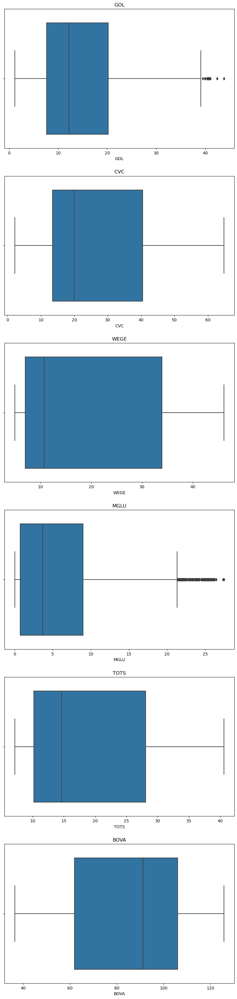

In [35]:
plt.figure(figsize=(10,50))
for i in np.arange(1, len(acoes_df.columns)):
    plt.subplot(7, 1, i+1)
    sns.boxplot(x=acoes_df[acoes_df.columns[i]])
    plt.title(acoes_df.columns[i])

## 3.4 Historical Series

<Axes: title={'center': 'Historical Prices of Stocks'}, xlabel='Date'>

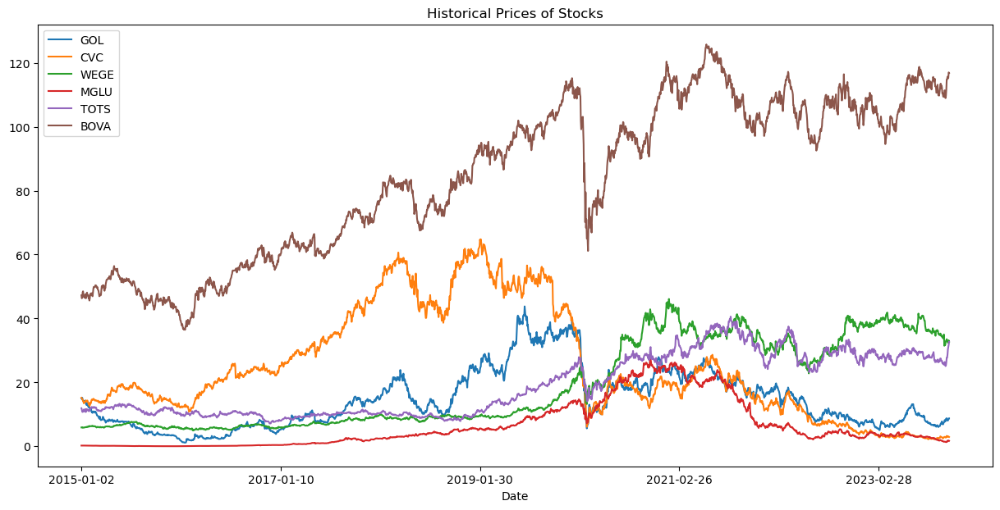

In [36]:
acoes_df.plot(x='Date', figsize=(15,7), title='Historical Prices of Stocks')

## 3.5 Normalization of Stock Prices

In [37]:
acoes_df_normalized = acoes_df.copy()

In [38]:
for i in acoes_df_normalized.columns[1:]:
    acoes_df_normalized[i] = acoes_df_normalized[i] / acoes_df_normalized[i][0]

In [39]:
acoes_df_normalized

,Date,GOL,CVC,WEGE,MGLU,TOTS,BOVA
0,2015-01-02,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2015-01-05,0.990660,0.986842,1.006818,1.018792,0.969274,0.980110
2,2015-01-06,1.014676,0.973684,0.991883,1.005369,0.908659,0.985612
3,2015-01-07,0.970647,0.965132,0.980520,1.038928,0.902235,1.018832
4,2015-01-08,0.951968,0.930921,0.997078,1.030875,0.923184,1.026449
...,...,...,...,...,...,...,...
2173,2023-11-07,0.537025,0.207237,5.534286,7.602701,2.408758,2.447524
2174,2023-11-08,0.538359,0.203947,5.478572,7.645654,2.544770,2.444350
2175,2023-11-09,0.555704,0.198026,5.471819,7.344982,2.601022,2.437156
2176,2023-11-10,0.583055,0.200000,5.600130,7.731560,2.669868,2.475878


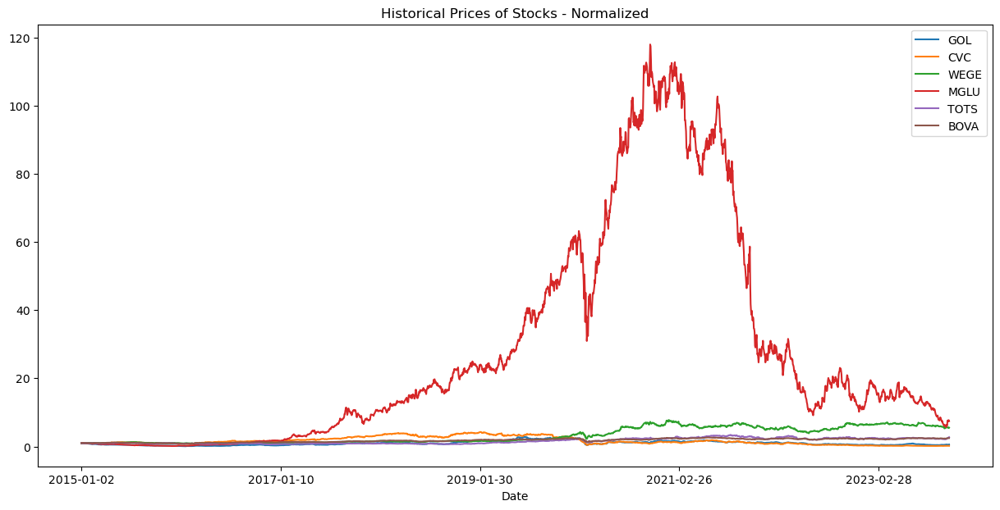

In [40]:
acoes_df_normalized.plot(x = 'Date', figsize = (15,7), title = 'Historical Prices of Stocks - Normalized');

In [41]:
fig = px.line(title = 'Historical Prices of Stocks')
for i in acoes_df.columns[1:]:
  fig.add_scatter(x=acoes_df['Date'], y = acoes_df[i], name = i)
fig.show()

In [42]:
fig = px.line(title = 'Historical Prices of Stocks - Normalized')
for i in acoes_df_normalized.columns[1:]:
  fig.add_scatter(x = acoes_df_normalized['Date'], y = acoes_df_normalized[i], name = i)
fig.show()

# 4. Another Stock Portfolio <a id='AnotherStockPortfolio'></a>

[Summary](#Summary)

In [43]:
acoes_ex = ['ABEV3.SA', 'ODPV3.SA', 'VIVT3.SA', 'PETR3.SA', 'BBAS3.SA', 'BOVA11.SA']

In [44]:
# Load the list of stocks
acoes_ex_df = pd.DataFrame()
for acao in acoes_ex:
    acoes_ex_df[acao] = yf.download(acao, start='2015-01-01')['Close']

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


In [45]:
acoes_ex_df = acoes_ex_df.rename(columns={'ABEV3.SA':'AMBEV',
                                          'ODPV3.SA':'ODONTOPREV',
                                          'VIVT3.SA':'VIVO',
                                          'PETR3.SA':'PETROBRAS',
                                          'BBAS3.SA':'BBRASIL',
                                          'BOVA11.SA':'BOVA'})

In [46]:
acoes_ex_df.to_csv('acoes_ex.csv')

In [47]:
acoes_ex_df = pd.read_csv('acoes_ex.csv')
acoes_ex_df

,Date,AMBEV,ODONTOPREV,VIVO,PETROBRAS,BBRASIL,BOVA
0,2015-01-02,16.020000,9.37,37.820000,9.000000,22.650000,47.259998
1,2015-01-05,15.730000,9.62,37.070000,8.270000,22.180000,46.320000
2,2015-01-06,16.330000,9.55,36.150002,8.060000,22.490000,46.580002
3,2015-01-07,16.559999,9.69,37.389999,8.450000,23.480000,48.150002
4,2015-01-08,16.540001,9.66,38.910000,9.020000,23.559999,48.509998
...,...,...,...,...,...,...,...
2201,2023-11-08,13.540000,12.10,49.570000,36.759998,51.669998,115.519997
2202,2023-11-09,13.410000,11.85,49.509998,37.540001,49.509998,115.180000
2203,2023-11-10,13.350000,11.94,50.099998,37.419998,50.240002,117.010002
2204,2023-11-13,13.430000,11.82,50.660000,38.259998,50.049999,116.820000


In [48]:
acoes_ex_df.describe()

,AMBEV,ODONTOPREV,VIVO,PETROBRAS,BBRASIL,BOVA
count,2206.000000,2206.000000,2206.000000,2206.000000,2206.000000,2179.000000
mean,17.101197,12.775471,41.903690,23.042643,33.777974,84.511519
std,2.561360,2.295927,5.137767,8.636254,9.882699,24.287585
min,11.030000,8.130000,28.980000,5.910000,12.700000,36.450001
25%,15.010000,11.040000,38.099998,15.205000,27.865000,61.950001
50%,17.389999,12.670000,41.880001,23.650000,32.980000,91.209999
75%,18.917500,14.427500,45.047500,30.020000,40.495000,106.090000
max,24.270000,18.430000,56.740002,41.560001,55.180000,125.750000


In [49]:
import numpy as np

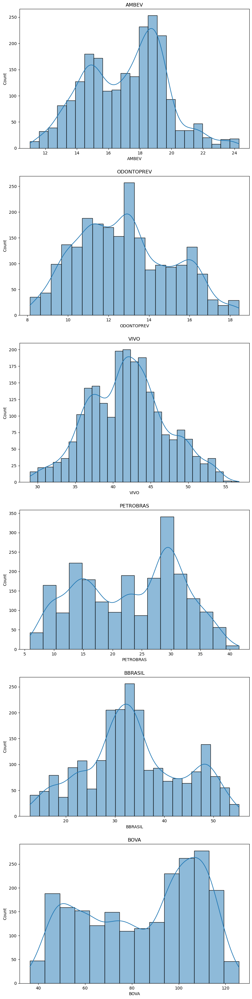

In [50]:
plt.figure(figsize=(10,50))
for i in np.arange(1,len(acoes_ex_df.columns)):
    plt.subplot(7, 1, i+1)
    sns.histplot(acoes_ex_df[acoes_ex_df.columns[i]], kde=True)
    plt.title(acoes_ex_df.columns[i])

In [51]:
fig = px.line(title='Historical Prices of Stocks')
for i in acoes_ex_df.columns[1:]:
    fig.add_scatter(x=acoes_ex_df['Date'], y=acoes_ex_df[i], name=i)
fig.show()

In [52]:
acoes_ex_df_normalized = acoes_ex_df.copy()
for i in acoes_ex_df_normalized.columns[1:]:
    acoes_ex_df_normalized[i]=acoes_ex_df_normalized[i] / acoes_ex_df_normalized[i][0]

In [53]:
acoes_ex_df_normalized

,Date,AMBEV,ODONTOPREV,VIVO,PETROBRAS,BBRASIL,BOVA
0,2015-01-02,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2015-01-05,0.981898,1.026681,0.980169,0.918889,0.979249,0.980110
2,2015-01-06,1.019351,1.019210,0.955844,0.895556,0.992936,0.985612
3,2015-01-07,1.033708,1.034152,0.988630,0.938889,1.036645,1.018832
4,2015-01-08,1.032459,1.030950,1.028821,1.002222,1.040177,1.026449
...,...,...,...,...,...,...,...
2201,2023-11-08,0.845193,1.291355,1.310682,4.084444,2.281236,2.444350
2202,2023-11-09,0.837079,1.264675,1.309096,4.171111,2.185872,2.437156
2203,2023-11-10,0.833333,1.274280,1.324696,4.157778,2.218102,2.475878
2204,2023-11-13,0.838327,1.261473,1.339503,4.251111,2.209713,2.471858


In [54]:
fig = px.line(title='Historical Prices of Stocks - Normalized')
for i in acoes_ex_df_normalized.columns[1:]:
    fig.add_scatter(x=acoes_ex_df_normalized['Date'], y=acoes_ex_df_normalized[i], name=i)
fig.show()

[Summary](#Summary)

# 5. Return Rates <a id='ReturnRates'></a>

## 5.1 Import Python Modules

In [58]:
import pandas as pd
import numpy as np
import plotly.express as px

## 5.2 Load the Working Dataset

In [59]:
dataset = pd.read_csv('acoes.csv')

In [60]:
dataset.shape

(2178, 7)

In [61]:
dataset.head()

,Date,GOL,CVC,WEGE,MGLU,TOTS,BOVA
0,2015-01-02,14.99,15.20,5.923076,0.232812,11.910702,47.259998
1,2015-01-05,14.85,15.00,5.963461,0.237187,11.544731,46.320000
2,2015-01-06,15.21,14.80,5.875000,0.234062,10.822770,46.580002
3,2015-01-07,14.55,14.67,5.807692,0.241875,10.746248,48.150002
4,2015-01-08,14.27,14.15,5.905769,0.240000,10.995774,48.509998


In [62]:
dataset.tail()

,Date,GOL,CVC,WEGE,MGLU,TOTS,BOVA
2173,2023-11-07,8.05,3.15,32.779999,1.77,28.690001,115.669998
2174,2023-11-08,8.07,3.10,32.450001,1.78,30.309999,115.519997
2175,2023-11-09,8.33,3.01,32.410000,1.71,30.980000,115.180000
2176,2023-11-10,8.74,3.04,33.169998,1.80,31.799999,117.010002
2177,2023-11-13,8.74,2.93,32.720001,1.73,32.700001,116.820000


## 5.3 Simple Return Rate

### 5.3.1 Simple Return Rate for 'GOL'

In [63]:
dataset['GOL']

0       14.99
1       14.85
2       15.21
3       14.55
4       14.27
        ...  
2173     8.05
2174     8.07
2175     8.33
2176     8.74
2177     8.74
Name: GOL, Length: 2178, dtype: float64

In [64]:
# Simple Return Rate (SRR) for 'GOL'
initial_value = dataset['GOL'][0]
final_value = dataset['GOL'][len(dataset) - 1]
SRR = ((final_value - initial_value) / initial_value) * 100
SRR

-41.69446361194832

### 5.3.2 Simple Return Rate (SRR) for the Stocks in the Entire Period

In [65]:
acoes_df.columns[1:]

Index(['GOL', 'CVC', 'WEGE', 'MGLU', 'TOTS', 'BOVA'], dtype='object')

In [66]:
# Create a dictionary for the SRR of each stock
SRR = {}
for stock in acoes_df.columns[1:]:
    initial_value = dataset[stock][0]
    final_value = dataset[stock][len(dataset) - 1]
    SRR[stock] = ((final_value - initial_value) / initial_value) * 100

In [67]:
for key, value in SRR.items():
        print(f'{key}: {value}')

GOL: -41.69446361194832
CVC: -80.7236835294483
WEGE: 452.41567686458205
MGLU: 643.0888450652914
TOTS: 174.54302395110815
BOVA: 147.1857889203462


In [68]:
dataset_bkp = dataset.copy()

In [69]:
# Normalizing the dataset
# (dividing all columns of all rows by the corresponding columns of the first row)
for stock in acoes_df.columns[1:]:
    dataset['SRR '+ stock] = (dataset[stock] / dataset[stock].shift(1)) - 1

In [70]:
dataset

,Date,GOL,CVC,WEGE,MGLU,TOTS,BOVA,SRR GOL,SRR CVC,SRR WEGE,SRR MGLU,SRR TOTS,SRR BOVA
0,2015-01-02,14.99,15.20,5.923076,0.232812,11.910702,47.259998,NaN,NaN,NaN,NaN,NaN,NaN
1,2015-01-05,14.85,15.00,5.963461,0.237187,11.544731,46.320000,-0.009340,-0.013158,0.006818,0.018792,-0.030726,-0.019890
2,2015-01-06,15.21,14.80,5.875000,0.234062,10.822770,46.580002,0.024242,-0.013333,-0.014834,-0.013175,-0.062536,0.005613
3,2015-01-07,14.55,14.67,5.807692,0.241875,10.746248,48.150002,-0.043392,-0.008784,-0.011457,0.033380,-0.007070,0.033705
4,2015-01-08,14.27,14.15,5.905769,0.240000,10.995774,48.509998,-0.019244,-0.035447,0.016887,-0.007752,0.023220,0.007477
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2173,2023-11-07,8.05,3.15,32.779999,1.770000,28.690001,115.669998,-0.013480,0.067797,-0.012948,0.237762,0.035740,0.007491
2174,2023-11-08,8.07,3.10,32.450001,1.780000,30.309999,115.519997,0.002484,-0.015873,-0.010067,0.005650,0.056466,-0.001297
2175,2023-11-09,8.33,3.01,32.410000,1.710000,30.980000,115.180000,0.032218,-0.029032,-0.001233,-0.039326,0.022105,-0.002943
2176,2023-11-10,8.74,3.04,33.169998,1.800000,31.799999,117.010002,0.049220,0.009967,0.023450,0.052632,0.026469,0.015888


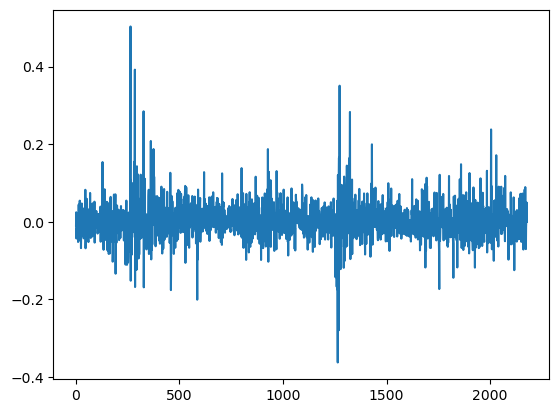

In [71]:
dataset['SRR GOL'].plot();

In [72]:
dataset['SRR GOL'].mean()

0.0009001952577079938

In [73]:
# There are about 246 working days (Monday to Friday) in a year
dataset.head(246)

,Date,GOL,CVC,WEGE,MGLU,TOTS,BOVA,SRR GOL,SRR CVC,SRR WEGE,SRR MGLU,SRR TOTS,SRR BOVA
0,2015-01-02,14.99,15.20,5.923076,0.232812,11.910702,47.259998,NaN,NaN,NaN,NaN,NaN,NaN
1,2015-01-05,14.85,15.00,5.963461,0.237187,11.544731,46.320000,-0.009340,-0.013158,0.006818,0.018792,-0.030726,-0.019890
2,2015-01-06,15.21,14.80,5.875000,0.234062,10.822770,46.580002,0.024242,-0.013333,-0.014834,-0.013175,-0.062536,0.005613
3,2015-01-07,14.55,14.67,5.807692,0.241875,10.746248,48.150002,-0.043392,-0.008784,-0.011457,0.033380,-0.007070,0.033705
4,2015-01-08,14.27,14.15,5.905769,0.240000,10.995774,48.509998,-0.019244,-0.035447,0.016887,-0.007752,0.023220,0.007477
...,...,...,...,...,...,...,...,...,...,...,...,...,...
241,2015-12-23,2.46,12.48,5.980769,0.046093,10.646438,42.750000,-0.012048,0.010526,0.005171,0.084541,0.032258,0.012314
242,2015-12-28,2.39,12.45,6.061538,0.063281,10.430182,42.500000,-0.028455,-0.002404,0.013505,0.372898,-0.020312,-0.005848
243,2015-12-29,2.39,13.10,5.992307,0.070117,10.430182,42.419998,0.000000,0.052209,-0.011421,0.108026,0.000000,-0.001882
244,2015-12-30,2.52,13.50,5.750000,0.068945,10.323718,42.130001,0.054393,0.030534,-0.040436,-0.016715,-0.010207,-0.006836


In [74]:
# Calculating the mean, considering 245 working days
(dataset['SRR GOL'].mean() * 245) * 100

22.054783813845848

In [75]:
# Calculating the mean, considering 245 working days
(dataset['SRR GOL'].mean() * 246) * 100

22.144803339616647

In [76]:
# Calculating the average annual return rate (in average) for the stocks in
# our portfolio
for stock in acoes_df.columns[1:]:
     print(f'{stock}: {(dataset["SRR " + stock].mean() * 246) * 100}')

GOL: 22.144803339616647
CVC: 0.35838322531848776
WEGE: 25.199296771899597
MGLU: 45.10174775128682
TOTS: 18.85640233989264
BOVA: 13.41869966502299


## 5.4 Logarithmic Return Rate

Utiliza-se para as ações da mesma companhia, em diferentes períodos do tempo

Used for the stocks of the same company, in different periods of time

In [77]:
dataset['GOL']

0       14.99
1       14.85
2       15.21
3       14.55
4       14.27
        ...  
2173     8.05
2174     8.07
2175     8.33
2176     8.74
2177     8.74
Name: GOL, Length: 2178, dtype: float64

In [78]:
initial_value = dataset['GOL'][0]
initial_value

14.989999771118164

In [79]:
final_value = dataset['GOL'][len(dataset) - 1]
final_value

8.739999771118164

In [80]:
LRR_GOL = np.log(final_value / initial_value) * 100
LRR_GOL

-53.947313336594725

In [81]:
dataset['MGLU']

0       0.232812
1       0.237187
2       0.234062
3       0.241875
4       0.240000
          ...   
2173    1.770000
2174    1.780000
2175    1.710000
2176    1.800000
2177    1.730000
Name: MGLU, Length: 2178, dtype: float64

In [82]:
initial_value = dataset['MGLU'][0]
initial_value

0.2328120023012161

In [83]:
final_value = dataset['MGLU'][len(dataset) - 1]
final_value

1.7300000190734863

In [84]:
LRR_MGLU = np.log(final_value / initial_value) * 100
LRR_MGLU

200.5645427711956

### 5.4.1 Logarithmic Return Rate (LRR) for the Stocks in the Entire Period

In [85]:
# Create a dictionary for the LRR (Logarithmic Return Rate) of each stock
# for the entire period
LRR = {}
for stock in acoes_df.columns[1:]:
    initial_value = dataset[stock][0]
    final_value = dataset[stock][len(dataset) - 1]
    LRR[stock] = np.log(final_value / initial_value) * 100

In [86]:
LRR

{'GOL': -53.947313336594725,
 'CVC': -164.6292969490881,
 'WEGE': 170.91306146964573,
 'MGLU': 200.5645427711956,
 'TOTS': 100.99377983850486,
 'BOVA': 90.49700497566334}

# Simulating

* Buy: 100 stocks, value = 14.99
* Sell: 100 stocks, value = 16.07
* Valor da corretagem na compra: 10.00
* Valor da corretagem na venda: 2.50
* Ganho de dividendos por ação: 0.25
    
Compra: 100 * 14.99 + 10.00 = 1499.00 + 10.00 = 1509.00
Venda: 100 * 16.07 + 100 * 0.25 - 2.50 = 1607.00 + 25.00 - 2.50 = 1629.50
    
RL = log(1629.50 / 1509.00) * 100 = 7.68


In [87]:
rl = np.log(1629.50 / 1509.00) * 100
rl

7.68260395097673

### 5.4.2 Daily Logarithmic Return Rate

In [88]:
dataset_bkp = dataset.copy()

In [89]:
for stock in acoes_df.columns[1:]:
    dataset['LRR '+ stock] = np.log(dataset[stock] / dataset[stock].shift(1))

In [90]:
dataset

,Date,GOL,CVC,WEGE,MGLU,TOTS,BOVA,SRR GOL,SRR CVC,SRR WEGE,SRR MGLU,SRR TOTS,SRR BOVA,LRR GOL,LRR CVC,LRR WEGE,LRR MGLU,LRR TOTS,LRR BOVA
0,2015-01-02,14.99,15.20,5.923076,0.232812,11.910702,47.259998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2015-01-05,14.85,15.00,5.963461,0.237187,11.544731,46.320000,-0.009340,-0.013158,0.006818,0.018792,-0.030726,-0.019890,-0.009383,-0.013245,0.006795,0.018618,-0.031208,-0.020090
2,2015-01-06,15.21,14.80,5.875000,0.234062,10.822770,46.580002,0.024242,-0.013333,-0.014834,-0.013175,-0.062536,0.005613,0.023953,-0.013423,-0.014945,-0.013263,-0.064577,0.005597
3,2015-01-07,14.55,14.67,5.807692,0.241875,10.746248,48.150002,-0.043392,-0.008784,-0.011457,0.033380,-0.007070,0.033705,-0.044362,-0.008823,-0.011523,0.032835,-0.007096,0.033150
4,2015-01-08,14.27,14.15,5.905769,0.240000,10.995774,48.509998,-0.019244,-0.035447,0.016887,-0.007752,0.023220,0.007477,-0.019432,-0.036090,0.016746,-0.007782,0.022954,0.007449
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2173,2023-11-07,8.05,3.15,32.779999,1.770000,28.690001,115.669998,-0.013480,0.067797,-0.012948,0.237762,0.035740,0.007491,-0.013572,0.065597,-0.013032,0.213305,0.035116,0.007463
2174,2023-11-08,8.07,3.10,32.450001,1.780000,30.309999,115.519997,0.002484,-0.015873,-0.010067,0.005650,0.056466,-0.001297,0.002481,-0.016000,-0.010118,0.005634,0.054929,-0.001298
2175,2023-11-09,8.33,3.01,32.410000,1.710000,30.980000,115.180000,0.032218,-0.029032,-0.001233,-0.039326,0.022105,-0.002943,0.031710,-0.029462,-0.001233,-0.040120,0.021864,-0.002948
2176,2023-11-10,8.74,3.04,33.169998,1.800000,31.799999,117.010002,0.049220,0.009967,0.023450,0.052632,0.026469,0.015888,0.048047,0.009917,0.023179,0.051293,0.026124,0.015763


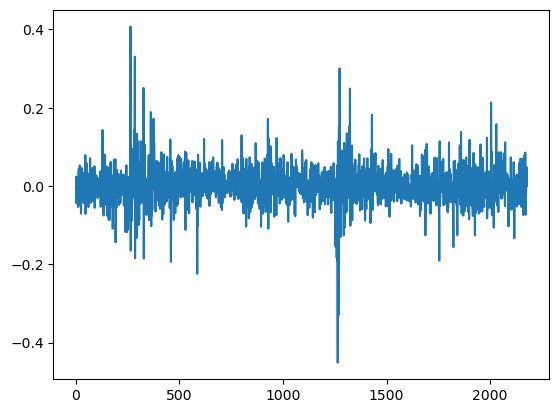

In [91]:
dataset['LRR GOL'].plot();

### 5.4.3 Average Annual Logarithmic Return Rate

In [92]:
(dataset['LRR GOL'].mean() * 246) * 100

-6.096021626459536

In [93]:
# Calculating the average annual logarithmic return rate for the stocks in
# our portfolio
for stock in acoes_df.columns[1:]:
     print(f'{stock}: {(dataset["LRR " + stock].mean() * 246) * 100}')

GOL: -6.096021626459536
CVC: -18.60303493315373
WEGE: 19.313097437543803
MGLU: 22.66370120427843
TOTS: 11.412250730487928
BOVA: 10.226119992656496


[Summary](#Summary)

# 6. Calculating the Return for the Stock Portfolio (GOL, CVC, WEGE, MGLU, TOTS) <a id='Portfolio1'></a>

In [94]:
dataset = pd.read_csv('acoes.csv')
dataset

,Date,GOL,CVC,WEGE,MGLU,TOTS,BOVA
0,2015-01-02,14.99,15.20,5.923076,0.232812,11.910702,47.259998
1,2015-01-05,14.85,15.00,5.963461,0.237187,11.544731,46.320000
2,2015-01-06,15.21,14.80,5.875000,0.234062,10.822770,46.580002
3,2015-01-07,14.55,14.67,5.807692,0.241875,10.746248,48.150002
4,2015-01-08,14.27,14.15,5.905769,0.240000,10.995774,48.509998
...,...,...,...,...,...,...,...
2173,2023-11-07,8.05,3.15,32.779999,1.770000,28.690001,115.669998
2174,2023-11-08,8.07,3.10,32.450001,1.780000,30.309999,115.519997
2175,2023-11-09,8.33,3.01,32.410000,1.710000,30.980000,115.180000
2176,2023-11-10,8.74,3.04,33.169998,1.800000,31.799999,117.010002


In [95]:
# Make the values for each column of the first row equal 1 and divide the columns of the other rows by 
# the corresponding column of the first row
dataset_normalizado = dataset.copy()
for i in dataset_normalizado.columns[1:]:
    dataset_normalizado[i] = (dataset_normalizado[i] / dataset_normalizado[i][0])

In [96]:
dataset_normalizado

,Date,GOL,CVC,WEGE,MGLU,TOTS,BOVA
0,2015-01-02,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2015-01-05,0.990660,0.986842,1.006818,1.018792,0.969274,0.980110
2,2015-01-06,1.014676,0.973684,0.991883,1.005369,0.908659,0.985612
3,2015-01-07,0.970647,0.965132,0.980520,1.038928,0.902235,1.018832
4,2015-01-08,0.951968,0.930921,0.997078,1.030875,0.923184,1.026449
...,...,...,...,...,...,...,...
2173,2023-11-07,0.537025,0.207237,5.534286,7.602701,2.408758,2.447524
2174,2023-11-08,0.538359,0.203947,5.478572,7.645654,2.544770,2.444350
2175,2023-11-09,0.555704,0.198026,5.471819,7.344982,2.601022,2.437156
2176,2023-11-10,0.583055,0.200000,5.600130,7.731560,2.669868,2.475878


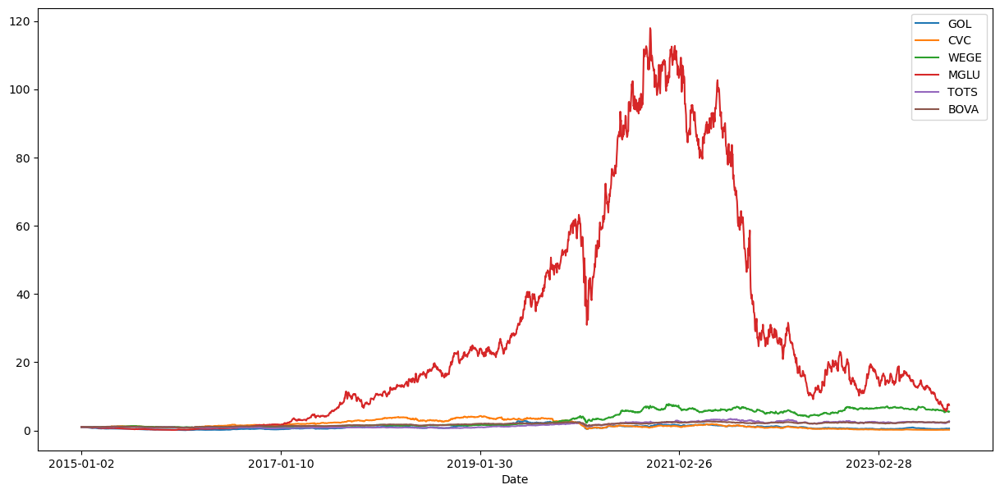

In [97]:
dataset_normalizado.plot(x = 'Date', figsize=(15,7));

In [98]:
# Deleting the 'Date' column
dataset_normalizado_bkp = dataset_normalizado
dataset_normalizado.drop(labels='Date', axis=1, inplace=True)

In [99]:
dataset_normalizado.head()

,GOL,CVC,WEGE,MGLU,TOTS,BOVA
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.990660,0.986842,1.006818,1.018792,0.969274,0.980110
2,1.014676,0.973684,0.991883,1.005369,0.908659,0.985612
3,0.970647,0.965132,0.980520,1.038928,0.902235,1.018832
4,0.951968,0.930921,0.997078,1.030875,0.923184,1.026449


## 6.1 Calculating the Daily Return

In [100]:
retorno_carteira = (dataset_normalizado / dataset_normalizado.shift(1)) - 1
retorno_carteira.head()

,GOL,CVC,WEGE,MGLU,TOTS,BOVA
0,NaN,NaN,NaN,NaN,NaN,NaN
1,-0.009340,-0.013158,0.006818,0.018792,-0.030726,-0.019890
2,0.024242,-0.013333,-0.014834,-0.013175,-0.062536,0.005613
3,-0.043392,-0.008784,-0.011457,0.033380,-0.007070,0.033705
4,-0.019244,-0.035447,0.016887,-0.007752,0.023220,0.007477


## 6.2 Calculating the Average Annual Return

In [101]:
retorno_anual = (retorno_carteira.mean() * 246) * 100
retorno_anual

GOL     22.144803
CVC      0.358383
WEGE    25.199297
MGLU    45.101748
TOTS    18.856402
BOVA    13.418700
dtype: float64

## 6.3 Calculate the weights for the portfolio's stocks

In [102]:
# Calculating the portfolio's return 
# using weights given by pesos_carteira1
pesos_carteira1 = np.array([0.2, 0.2, 0.2, 0.2, 0.2, 0.0])

In [103]:
pesos_carteira1.sum()

1.0

In [104]:
np.dot(retorno_anual, pesos_carteira1)

22.33212668560286

In [105]:
# Calculating the portfolio's return 
# using weights given by pesos_carteira2
pesos_carteira2 = np.array([0.1, 0.2, 0.2, 0.4, 0.1, 0.0])

In [106]:
pesos_carteira2.sum()

1.0

In [107]:
np.dot(retorno_anual, pesos_carteira2)

27.252355667909292

## 6.4 Graphic Comparing Portfolio X BOVA

In [108]:
dataset = pd.read_csv('acoes.csv')

In [109]:
dataset_normalizado = dataset.copy()
for i in dataset_normalizado.columns[1:]:
    dataset_normalizado[i] = (dataset_normalizado[i] / dataset_normalizado[i][0])
dataset_normalizado.head()

,Date,GOL,CVC,WEGE,MGLU,TOTS,BOVA
0,2015-01-02,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2015-01-05,0.990660,0.986842,1.006818,1.018792,0.969274,0.980110
2,2015-01-06,1.014676,0.973684,0.991883,1.005369,0.908659,0.985612
3,2015-01-07,0.970647,0.965132,0.980520,1.038928,0.902235,1.018832
4,2015-01-08,0.951968,0.930921,0.997078,1.030875,0.923184,1.026449


In [110]:
dataset_normalizado['CARTEIRA'] = (dataset_normalizado['GOL'] + dataset_normalizado['CVC'] + dataset_normalizado['WEGE'] + dataset_normalizado['MGLU'] + dataset_normalizado['TOTS']) / 5
dataset_normalizado

,Date,GOL,CVC,WEGE,MGLU,TOTS,BOVA,CARTEIRA
0,2015-01-02,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2015-01-05,0.990660,0.986842,1.006818,1.018792,0.969274,0.980110,0.994477
2,2015-01-06,1.014676,0.973684,0.991883,1.005369,0.908659,0.985612,0.978854
3,2015-01-07,0.970647,0.965132,0.980520,1.038928,0.902235,1.018832,0.971492
4,2015-01-08,0.951968,0.930921,0.997078,1.030875,0.923184,1.026449,0.966805
...,...,...,...,...,...,...,...,...
2173,2023-11-07,0.537025,0.207237,5.534286,7.602701,2.408758,2.447524,3.258001
2174,2023-11-08,0.538359,0.203947,5.478572,7.645654,2.544770,2.444350,3.282261
2175,2023-11-09,0.555704,0.198026,5.471819,7.344982,2.601022,2.437156,3.234311
2176,2023-11-10,0.583055,0.200000,5.600130,7.731560,2.669868,2.475878,3.356923


In [111]:
figura = px.line(title = 'Comparativo carteira x BOVA')
for i in dataset_normalizado.columns[1:]:
    figura.add_scatter(x = dataset_normalizado['Date'], y = dataset_normalizado[i], name = i)
figura.show()

In [112]:
dataset_normalizado.drop(['GOL', 'WEGE', 'CVC', 'MGLU', 'TOTS'], axis = 1, inplace= True)
dataset_normalizado

,Date,BOVA,CARTEIRA
0,2015-01-02,1.000000,1.000000
1,2015-01-05,0.980110,0.994477
2,2015-01-06,0.985612,0.978854
3,2015-01-07,1.018832,0.971492
4,2015-01-08,1.026449,0.966805
...,...,...,...
2173,2023-11-07,2.447524,3.258001
2174,2023-11-08,2.444350,3.282261
2175,2023-11-09,2.437156,3.234311
2176,2023-11-10,2.475878,3.356923


In [113]:
figura = px.line(title = 'Comparativo carteira x BOVA')
for i in dataset_normalizado.columns[1:]:
    figura.add_scatter(x = dataset_normalizado['Date'], y = dataset_normalizado[i], name = i)
figura.show()

[Summary](#Summary)

# 7. Calculating the Return for the Stock Portfolio (AMBEV, ODONTOPREV, VIVO, PETROBRAS, BBRASIL) <a id='Portfolio2'></a>

In [114]:
dataset = pd.read_csv('acoes_ex.csv')
dataset

,Date,AMBEV,ODONTOPREV,VIVO,PETROBRAS,BBRASIL,BOVA
0,2015-01-02,16.020000,9.37,37.820000,9.000000,22.650000,47.259998
1,2015-01-05,15.730000,9.62,37.070000,8.270000,22.180000,46.320000
2,2015-01-06,16.330000,9.55,36.150002,8.060000,22.490000,46.580002
3,2015-01-07,16.559999,9.69,37.389999,8.450000,23.480000,48.150002
4,2015-01-08,16.540001,9.66,38.910000,9.020000,23.559999,48.509998
...,...,...,...,...,...,...,...
2201,2023-11-08,13.540000,12.10,49.570000,36.759998,51.669998,115.519997
2202,2023-11-09,13.410000,11.85,49.509998,37.540001,49.509998,115.180000
2203,2023-11-10,13.350000,11.94,50.099998,37.419998,50.240002,117.010002
2204,2023-11-13,13.430000,11.82,50.660000,38.259998,50.049999,116.820000


In [115]:
acoes_df_normalizado = dataset.copy()
for i in acoes_df_normalizado.columns[1:]:
    acoes_df_normalizado[i] = (acoes_df_normalizado[i] / acoes_df_normalizado[i][0])

In [116]:
acoes_df_normalizado.head()

,Date,AMBEV,ODONTOPREV,VIVO,PETROBRAS,BBRASIL,BOVA
0,2015-01-02,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2015-01-05,0.981898,1.026681,0.980169,0.918889,0.979249,0.980110
2,2015-01-06,1.019351,1.019210,0.955844,0.895556,0.992936,0.985612
3,2015-01-07,1.033708,1.034152,0.988630,0.938889,1.036645,1.018832
4,2015-01-08,1.032459,1.030950,1.028821,1.002222,1.040177,1.026449


## 7.1 Graphing the Portfolio

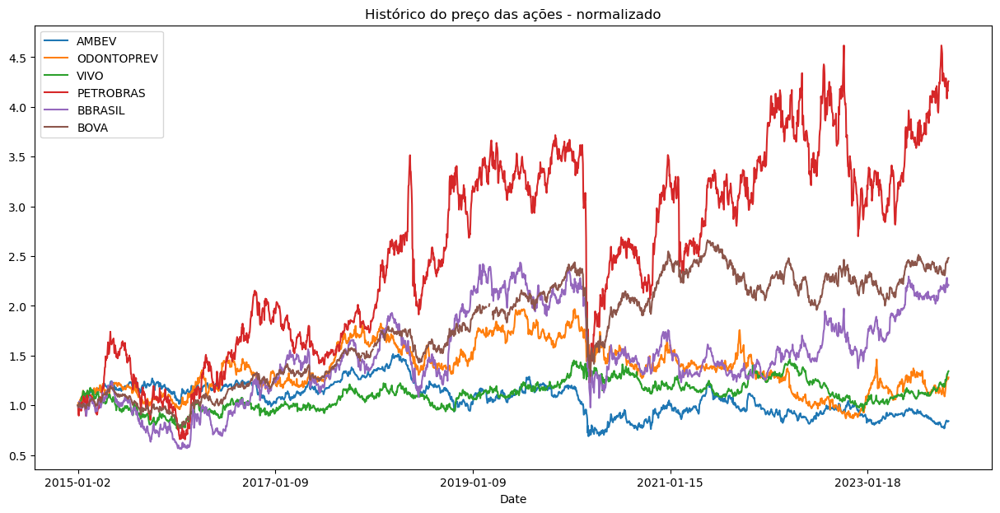

In [117]:
acoes_df_normalizado.plot(x = 'Date', figsize = (15,7), title = 'Histórico do preço das ações - normalizado');

In [118]:
acoes_df_normalizado.drop(labels = ['Date'], axis = 1, inplace = True)

In [119]:
retorno_carteira = (acoes_df_normalizado / acoes_df_normalizado.shift(1)) - 1
retorno_carteira.head()

,AMBEV,ODONTOPREV,VIVO,PETROBRAS,BBRASIL,BOVA
0,NaN,NaN,NaN,NaN,NaN,NaN
1,-0.018102,0.026681,-0.019831,-0.081111,-0.020751,-0.019890
2,0.038144,-0.007276,-0.024818,-0.025393,0.013977,0.005613
3,0.014084,0.014660,0.034301,0.048387,0.044020,0.033705
4,-0.001208,-0.003096,0.040653,0.067456,0.003407,0.007477


In [120]:
# Assuming 246 working days in a year
retorno_anual = retorno_carteira.mean() * 246 * 100
retorno_anual

AMBEV          1.644622
ODONTOPREV     7.889780
VIVO           7.432312
PETROBRAS     28.519824
BBRASIL       17.707204
BOVA          13.405953
dtype: float64

In [121]:
pesos_carteira = np.array([0.2, 0.2, 0.2, 0.2, 0.2, 0.0])

In [122]:
np.dot(retorno_anual, pesos_carteira)

12.63874839321997

## 7.2 Graphing the Normalized Portfolio

In [123]:
dataset = pd.read_csv('acoes_ex.csv')

In [124]:
acoes_df_normalizado = dataset.copy()
for i in acoes_df_normalizado.columns[1:]:
    acoes_df_normalizado[i] = (acoes_df_normalizado[i] / acoes_df_normalizado[i][0])

In [125]:
dataset.columns

Index(['Date', 'AMBEV', 'ODONTOPREV', 'VIVO', 'PETROBRAS', 'BBRASIL', 'BOVA'], dtype='object')

In [126]:
acoes_df_normalizado['CARTEIRA'] = (acoes_df_normalizado['AMBEV'] + acoes_df_normalizado['ODONTOPREV'] + acoes_df_normalizado['VIVO'] + acoes_df_normalizado['PETROBRAS'] + acoes_df_normalizado['BBRASIL']) / 5
acoes_df_normalizado

,Date,AMBEV,ODONTOPREV,VIVO,PETROBRAS,BBRASIL,BOVA,CARTEIRA
0,2015-01-02,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2015-01-05,0.981898,1.026681,0.980169,0.918889,0.979249,0.980110,0.977377
2,2015-01-06,1.019351,1.019210,0.955844,0.895556,0.992936,0.985612,0.976579
3,2015-01-07,1.033708,1.034152,0.988630,0.938889,1.036645,1.018832,1.006405
4,2015-01-08,1.032459,1.030950,1.028821,1.002222,1.040177,1.026449,1.026926
...,...,...,...,...,...,...,...,...
2201,2023-11-08,0.845193,1.291355,1.310682,4.084444,2.281236,2.444350,1.962582
2202,2023-11-09,0.837079,1.264675,1.309096,4.171111,2.185872,2.437156,1.953566
2203,2023-11-10,0.833333,1.274280,1.324696,4.157778,2.218102,2.475878,1.961638
2204,2023-11-13,0.838327,1.261473,1.339503,4.251111,2.209713,2.471858,1.980025


In [127]:
figura = px.line(title = 'Histórico do preço das ações')
for i in acoes_df_normalizado.columns[1:]:
    figura.add_scatter(x = acoes_df_normalizado['Date'], y = acoes_df_normalizado[i], name = i)
figura.show()

## 7.1 Graphic Comparing Normalized Portfolio X BOVA

In [128]:
acoes_df_normalizado.drop(['AMBEV', 'ODONTOPREV', 'VIVO', 'PETROBRAS', 'BBRASIL'], axis = 1, inplace = True)
acoes_df_normalizado

,Date,BOVA,CARTEIRA
0,2015-01-02,1.000000,1.000000
1,2015-01-05,0.980110,0.977377
2,2015-01-06,0.985612,0.976579
3,2015-01-07,1.018832,1.006405
4,2015-01-08,1.026449,1.026926
...,...,...,...
2201,2023-11-08,2.444350,1.962582
2202,2023-11-09,2.437156,1.953566
2203,2023-11-10,2.475878,1.961638
2204,2023-11-13,2.471858,1.980025


In [129]:
figura = px.line(title = 'Histórico do preço das ações')
for i in acoes_df_normalizado.columns[1:]:
    figura.add_scatter(x = acoes_df_normalizado['Date'], y = acoes_df_normalizado[i], name = i)
figura.show()

[Summary](#Summary)

# 8. Risk Analysis <a id='RiskAnalysis'></a>

## 8.1 Importing Python Modules

In [130]:
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

## 8.2 Loading Working Data Set

In [131]:
dataset = pd.read_csv('acoes.csv')
dataset

,Date,GOL,CVC,WEGE,MGLU,TOTS,BOVA
0,2015-01-02,14.99,15.20,5.923076,0.232812,11.910702,47.259998
1,2015-01-05,14.85,15.00,5.963461,0.237187,11.544731,46.320000
2,2015-01-06,15.21,14.80,5.875000,0.234062,10.822770,46.580002
3,2015-01-07,14.55,14.67,5.807692,0.241875,10.746248,48.150002
4,2015-01-08,14.27,14.15,5.905769,0.240000,10.995774,48.509998
...,...,...,...,...,...,...,...
2173,2023-11-07,8.05,3.15,32.779999,1.770000,28.690001,115.669998
2174,2023-11-08,8.07,3.10,32.450001,1.780000,30.309999,115.519997
2175,2023-11-09,8.33,3.01,32.410000,1.710000,30.980000,115.180000
2176,2023-11-10,8.74,3.04,33.169998,1.800000,31.799999,117.010002


In [132]:
dataset.shape

(2178, 7)

In [133]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2178 entries, 0 to 2177
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    2178 non-null   object 
 1   GOL     2178 non-null   float64
 2   CVC     2178 non-null   float64
 3   WEGE    2178 non-null   float64
 4   MGLU    2178 non-null   float64
 5   TOTS    2178 non-null   float64
 6   BOVA    2178 non-null   float64
dtypes: float64(6), object(1)
memory usage: 119.2+ KB


In [134]:
dataset.describe()

,GOL,CVC,WEGE,MGLU,TOTS,BOVA
count,2178.000000,2178.000000,2178.000000,2178.000000,2178.000000,2178.000000
mean,14.509793,25.283267,19.115624,6.433687,19.006479,84.496460
std,9.137674,16.929856,13.418185,7.369439,9.467957,24.282986
min,1.160000,2.200000,4.942307,0.030585,7.156402,36.450001
25%,7.600000,13.450000,6.974038,0.718037,10.208103,61.950001
50%,12.235000,19.985000,10.745000,3.675000,14.664394,91.204998
75%,20.207500,40.449999,33.900002,8.971875,28.082500,106.072502
max,43.790001,64.800003,46.105000,27.450001,40.599998,125.750000


On October, 25th, CVC has the biggest std and MGLU has the lowest

## 8.3 Calculating Annual Return

### 8.3.1 Year: 2015

In [135]:
first_day = '2015-01-02'
last_day  = '2015-12-30'

#### CVC

In [136]:
# First occurence for CVC in 2015
first = (dataset['CVC'][dataset['Date'] == first_day]).to_numpy()
first[0]

15.199999809265137

In [137]:
# Last occurence for CVC in 2015
last = (dataset['CVC'][dataset['Date'] == last_day]).to_numpy()
last[0]

13.5

In [138]:
# Calculing the return for CVC in 2015
np.log(last[0] / first[0]) * 100  

-11.860572985950062

#### MGLU

In [139]:
# First occurence for MGLU in 2015
first = (dataset['MGLU'][dataset['Date'] == first_day]).to_numpy()
first[0]

0.2328120023012161

In [140]:
# Last occurence for MGLU in 2015
last = (dataset['MGLU'][dataset['Date'] == last_day]).to_numpy()
last[0]

0.0689449980854988

In [141]:
# Calculing the return for MGLU in 2015
np.log(last[0] / first[0]) * 100

-121.69222132798294

### 8.3.2 Year: 2016

In [142]:
first_day = '2016-01-04'
last_day  = '2016-12-29'

#### CVC

In [143]:
# First occurence for CVC in 2016
first = (dataset['CVC'][dataset['Date'] == first_day]).to_numpy()
first[0]

12.529999732971191

In [144]:
# Last occurence for CVC in 2016
last = (dataset['CVC'][dataset['Date'] == last_day]).to_numpy()
last[0]

23.700000762939453

In [145]:
# Calculing the return for CVC in 2016
np.log(last[0] / first[0]) * 100  

63.73493327358042

#### MGLU

In [146]:
# First occurence for MGLU in 2016
first = (dataset['MGLU'][dataset['Date'] == first_day]).to_numpy()
first[0]

0.0701169967651367

In [147]:
# Last occurence for MGLU in 2016
last = (dataset['MGLU'][dataset['Date'] == last_day]).to_numpy()
last[0]

0.4147259891033172

In [148]:
# Calculing the return for MGLU in 2016
np.log(last[0] / first[0]) * 100

177.7452805734021

### 8.3.2 Year: 2017

In [149]:
first_day = '2017-01-02'
last_day  = '2017-12-28'

#### CVC

In [150]:
# First occurence for CVC in 2017
first = (dataset['CVC'][dataset['Date'] == first_day]).to_numpy()
first[0]

23.020000457763672

In [151]:
# Last occurence for CVC in 2017
last = (dataset['CVC'][dataset['Date'] == last_day]).to_numpy()
last[0]

48.5

In [152]:
# Calculing the return for CVC in 2017
np.log(last[0] / first[0]) * 100  

74.52003747642244

#### MGLU

In [153]:
# First occurence for MGLU in 2017
first = (dataset['MGLU'][dataset['Date'] == first_day]).to_numpy()
first[0]

0.3973039984703064

In [154]:
# Last occurence for MGLU in 2017
last = (dataset['MGLU'][dataset['Date'] == last_day]).to_numpy()
last[0]

2.5068750381469727

In [155]:
# Calculing the return for MGLU in 2017
np.log(last[0] / first[0]) * 100

184.2090524862851

### 8.3.2 Year: 2018

In [156]:
first_day = '2018-01-02'
last_day  = '2018-12-28'

#### CVC

In [157]:
# First occurence for CVC in 2018
first = (dataset['CVC'][dataset['Date'] == first_day]).to_numpy()
first[0]

49.880001068115234

In [158]:
# Last occurence for CVC in 2018
last = (dataset['CVC'][dataset['Date'] == last_day]).to_numpy()
last[0]

61.18000030517578

In [159]:
# Calculing the return for CVC in 2018
np.log(last[0] / first[0]) * 100   

20.42002014853868

#### MGLU

In [160]:
# First occurence for MGLU in 2018
first = (dataset['MGLU'][dataset['Date'] == first_day]).to_numpy()
first[0]

2.478125095367432

In [161]:
# Last occurence for MGLU in 2018
last = (dataset['MGLU'][dataset['Date'] == last_day]).to_numpy()
last[0]

5.65843677520752

In [162]:
# Calculing the return for MGLU in 2018
np.log(last[0] / first[0]) * 100

82.56454016174672

### 8.3.2 Year: 2019

In [163]:
first_day = '2019-01-02'
last_day  = '2019-12-30'

#### CVC

In [164]:
# First occurence for CVC in 2019
first = (dataset['CVC'][dataset['Date'] == first_day]).to_numpy()
first[0]

61.09999847412109

In [165]:
# Last occurence for CVC in 2019
last = (dataset['CVC'][dataset['Date'] == last_day]).to_numpy()
last[0]

43.79999923706055

In [166]:
# Calculing the return for CVC in 2019
np.log(last[0] / first[0]) * 100   

-33.28780412403897

#### MGLU

In [167]:
# First occurence for MGLU in 2019
first = (dataset['MGLU'][dataset['Date'] == first_day]).to_numpy()
first[0]

5.812187194824219

In [168]:
# Last occurence for MGLU in 2019
last = (dataset['MGLU'][dataset['Date'] == last_day]).to_numpy()
last[0]

11.925000190734863

In [169]:
# Calculing the return for MGLU in 2019
np.log(last[0] / first[0]) * 100

71.86800992478183

### 8.3.2 Year: 2020

In [170]:
first_day = '2020-01-02'
last_day  = '2020-12-30'

#### CVC

In [171]:
# First occurence for CVC in 2020
first = (dataset['CVC'][dataset['Date'] == first_day]).to_numpy()
first[0]

44.709999084472656

In [172]:
# Last occurence for CVC in 2020
last = (dataset['CVC'][dataset['Date'] == last_day]).to_numpy()
last[0]

20.57999992370605

In [173]:
# Calculing the return for CVC in 2020
np.log(last[0] / first[0]) * 100 

-77.58774430701594

#### MGLU

In [174]:
# First occurence for MGLU in 2020
first = (dataset['MGLU'][dataset['Date'] == first_day]).to_numpy()
first[0]

12.332500457763672

In [175]:
# Last occurence for MGLU in 2020
last = (dataset['MGLU'][dataset['Date'] == last_day]).to_numpy()
last[0]

24.950000762939453

In [176]:
# Calculing the return for MGLU in 2020
np.log(last[0] / first[0]) * 100

70.46357615320258

### 8.3.2 Year: 2021

In [177]:
first_day = '2021-01-04'
last_day  = '2021-12-30'

#### CVC

In [178]:
# First occurence for CVC in 2021
first = (dataset['CVC'][dataset['Date'] == first_day]).to_numpy()
first[0]

20.170000076293945

In [179]:
# Last occurence for CVC in 2021
last = (dataset['CVC'][dataset['Date'] == last_day]).to_numpy()
last[0]

13.420000076293944

In [180]:
# Calculing the return for CVC in 2021
np.log(last[0] / first[0]) * 100   

-40.745021852003774

#### MGLU

In [181]:
# First occurence for MGLU in 2021
first = (dataset['MGLU'][dataset['Date'] == first_day]).to_numpy()
first[0]

25.200000762939453

In [182]:
# Last occurence for MGLU in 2021
last = (dataset['MGLU'][dataset['Date'] == last_day]).to_numpy()
last[0]

7.21999979019165

In [183]:
# Calculing the return for MGLU in 2021
np.log(last[0] / first[0]) * 100

-124.99891009473461

### 8.3.2 Year: 2022

In [184]:
first_day = '2022-01-03'
last_day  = '2022-12-29'

#### CVC

In [185]:
# First occurence for CVC in 2022
first = (dataset['CVC'][dataset['Date'] == first_day]).to_numpy()
first[0]

12.869999885559082

In [186]:
# Last occurence for CVC in 2022
last = (dataset['CVC'][dataset['Date'] == last_day]).to_numpy()
last[0]

4.489999771118164

In [187]:
# Calculing the return for CVC in 2022
np.log(last[0] / first[0]) * 100  

-105.30463619377156

#### MGLU

In [188]:
# First occurence for MGLU in 2022
first = (dataset['MGLU'][dataset['Date'] == first_day]).to_numpy()
first[0]

6.71999979019165

In [189]:
# Last occurence for MGLU in 2022
last = (dataset['MGLU'][dataset['Date'] == last_day]).to_numpy()
last[0]

2.740000009536743

In [190]:
# Calculing the return for MGLU in 2022
np.log(last[0] / first[0]) * 100 

-89.71301994330351

## 8.4 Mean

In [191]:
taxas_cvc = np.array([-11.861, 63.735, 74.520, 20.420, -33.288, -77.588, -40.745, -105.305])

In [192]:
media_cvc = taxas_cvc.mean()
media_cvc

-13.764

In [193]:
taxas_mglu = np.array([-121.692, 177.745, 184.209, 82.565, 71.868, 70.464, -124.999, -89.713])

In [194]:
media_mglu = taxas_mglu.mean()
media_mglu

31.305875

## 8.5 Variance

In [195]:
taxas_cvc = np.array([-11.861, 63.735, 74.520, 20.420, -33.288, -77.588, -40.745, -105.305])

In [196]:
taxas_cvc

array([ -11.861,   63.735,   74.52 ,   20.42 ,  -33.288,  -77.588,
        -40.745, -105.305])

In [197]:
variancia_cvc = taxas_cvc.var()
variancia_cvc

3566.8431895000003

In [198]:
taxas_mglu = np.array([-121.692, 177.745, 184.209, 82.565, 71.868, 70.464, -124.999, -89.713])

In [199]:
taxas_mglu

array([-121.692,  177.745,  184.209,   82.565,   71.868,   70.464,
       -124.999,  -89.713])

In [200]:
variancia_mglu = taxas_mglu.var()
variancia_mglu

14139.382176109373

## 8.6 Standard Deviation

In [201]:
# Calculating standard deviation for CVC
desvio_padrao_cvc = math.sqrt(variancia_cvc)
desvio_padrao_cvc

59.7230540871781

In [202]:
taxas_cvc.std()

59.7230540871781

In [203]:
# Calculating standard deviation for GMLU
desvio_padrao_mglu = math.sqrt(variancia_mglu)
desvio_padrao_mglu

118.90913411554797

In [204]:
taxas_mglu.std()

118.90913411554797

In [205]:
# Calculating the variation in the last 30 days for CVC
dataset['CVC'].tail(30).std()

0.22292955122771477

In [206]:
# Calculating the variation in the last 30 days for MGLU
dataset['MGLU'].tail(30).std()

0.2170957571727111

In [207]:
# Calculating the variation in the last 180 days for CVC
dataset['CVC'].tail(180).std()

0.4891806238992297

In [208]:
# Calculating the variation in the last 180 days for MGLU
dataset['MGLU'].tail(180).std()

0.749325176219505

In [209]:
# Calculating the variation in the last 330 days for CVC
dataset['CVC'].tail(330).std()

1.7505594912463884

In [210]:
# Calculating the variation in the last 330 days for MGLU
dataset['MGLU'].tail(330).std()

0.8415284660307106

## 8.7 Coefficient of Variation

In [211]:
# Coefficient of Variation for CVC
stats.variation(taxas_cvc) * 100

-433.90768735235474

In [212]:
# Coefficient of Variation for CVC
coef_variacao_cvc = (desvio_padrao_cvc / media_cvc) * 100
coef_variacao_cvc

-433.90768735235474

In [213]:
# Coefficient of Variation for MGLU
stats.variation(taxas_mglu) * 100

379.8300929635347

In [214]:
# Coefficient of Variation for MGLU
coef_variacao_mglu = (desvio_padrao_mglu / media_mglu) * 100
coef_variacao_mglu

379.8300929635347

## 8.8 Annual Risk - Whole Portfolio

In [215]:
dataset.head()

,Date,GOL,CVC,WEGE,MGLU,TOTS,BOVA
0,2015-01-02,14.99,15.20,5.923076,0.232812,11.910702,47.259998
1,2015-01-05,14.85,15.00,5.963461,0.237187,11.544731,46.320000
2,2015-01-06,15.21,14.80,5.875000,0.234062,10.822770,46.580002
3,2015-01-07,14.55,14.67,5.807692,0.241875,10.746248,48.150002
4,2015-01-08,14.27,14.15,5.905769,0.240000,10.995774,48.509998


In [216]:
dataset.drop(labels=['Date'], axis=1, inplace=True)
dataset.head()

,GOL,CVC,WEGE,MGLU,TOTS,BOVA
0,14.99,15.20,5.923076,0.232812,11.910702,47.259998
1,14.85,15.00,5.963461,0.237187,11.544731,46.320000
2,15.21,14.80,5.875000,0.234062,10.822770,46.580002
3,14.55,14.67,5.807692,0.241875,10.746248,48.150002
4,14.27,14.15,5.905769,0.240000,10.995774,48.509998


In [217]:
taxas_retorno = (dataset / dataset.shift(1)) - 1
taxas_retorno

,GOL,CVC,WEGE,MGLU,TOTS,BOVA
0,NaN,NaN,NaN,NaN,NaN,NaN
1,-0.009340,-0.013158,0.006818,0.018792,-0.030726,-0.019890
2,0.024242,-0.013333,-0.014834,-0.013175,-0.062536,0.005613
3,-0.043392,-0.008784,-0.011457,0.033380,-0.007070,0.033705
4,-0.019244,-0.035447,0.016887,-0.007752,0.023220,0.007477
...,...,...,...,...,...,...
2173,-0.013480,0.067797,-0.012948,0.237762,0.035740,0.007491
2174,0.002484,-0.015873,-0.010067,0.005650,0.056466,-0.001297
2175,0.032218,-0.029032,-0.001233,-0.039326,0.022105,-0.002943
2176,0.049220,0.009967,0.023450,0.052632,0.026469,0.015888


In [218]:
# Standard deviation
taxas_retorno.std() * 100

GOL     4.841917
CVC     3.900556
WEGE    2.182344
MGLU    4.309483
TOTS    2.457861
BOVA    1.604642
dtype: float64

In [219]:
# Annual standard deviation
taxas_retorno.std() * 246

GOL     11.911115
CVC      9.595368
WEGE     5.368567
MGLU    10.601329
TOTS     6.046338
BOVA     3.947418
dtype: float64

In [220]:
# Annualizing
math.sqrt(246)

15.684387141358123

In [221]:
taxas_retorno.std() * math.sqrt(246)

GOL     0.759425
CVC     0.611778
WEGE    0.342287
MGLU    0.675916
TOTS    0.385500
BOVA    0.251678
dtype: float64

## 8.9 Correlation between Stocks

In [222]:
dataset

,GOL,CVC,WEGE,MGLU,TOTS,BOVA
0,14.99,15.20,5.923076,0.232812,11.910702,47.259998
1,14.85,15.00,5.963461,0.237187,11.544731,46.320000
2,15.21,14.80,5.875000,0.234062,10.822770,46.580002
3,14.55,14.67,5.807692,0.241875,10.746248,48.150002
4,14.27,14.15,5.905769,0.240000,10.995774,48.509998
...,...,...,...,...,...,...
2173,8.05,3.15,32.779999,1.770000,28.690001,115.669998
2174,8.07,3.10,32.450001,1.780000,30.309999,115.519997
2175,8.33,3.01,32.410000,1.710000,30.980000,115.180000
2176,8.74,3.04,33.169998,1.800000,31.799999,117.010002


In [223]:
taxas_retorno

,GOL,CVC,WEGE,MGLU,TOTS,BOVA
0,NaN,NaN,NaN,NaN,NaN,NaN
1,-0.009340,-0.013158,0.006818,0.018792,-0.030726,-0.019890
2,0.024242,-0.013333,-0.014834,-0.013175,-0.062536,0.005613
3,-0.043392,-0.008784,-0.011457,0.033380,-0.007070,0.033705
4,-0.019244,-0.035447,0.016887,-0.007752,0.023220,0.007477
...,...,...,...,...,...,...
2173,-0.013480,0.067797,-0.012948,0.237762,0.035740,0.007491
2174,0.002484,-0.015873,-0.010067,0.005650,0.056466,-0.001297
2175,0.032218,-0.029032,-0.001233,-0.039326,0.022105,-0.002943
2176,0.049220,0.009967,0.023450,0.052632,0.026469,0.015888


In [224]:
# Calculatin covariance between return rates
taxas_retorno.cov()

,GOL,CVC,WEGE,MGLU,TOTS,BOVA
GOL,0.002344,0.001027,0.000325,0.000725,0.000411,0.000453
CVC,0.001027,0.001521,0.000237,0.000635,0.000331,0.000333
WEGE,0.000325,0.000237,0.000476,0.000265,0.000210,0.000181
MGLU,0.000725,0.000635,0.000265,0.001857,0.000361,0.000317
TOTS,0.000411,0.000331,0.000210,0.000361,0.000604,0.000198
BOVA,0.000453,0.000333,0.000181,0.000317,0.000198,0.000257


In [225]:
# Calculating the correlation between return rates
taxas_retorno.corr()

,GOL,CVC,WEGE,MGLU,TOTS,BOVA
GOL,1.000000,0.543883,0.307275,0.347562,0.345350,0.583126
CVC,0.543883,1.000000,0.278852,0.377669,0.345347,0.531386
WEGE,0.307275,0.278852,1.000000,0.281426,0.391363,0.516589
MGLU,0.347562,0.377669,0.281426,1.000000,0.340487,0.458551
TOTS,0.345350,0.345347,0.391363,0.340487,1.000000,0.502090
BOVA,0.583126,0.531386,0.516589,0.458551,0.502090,1.000000


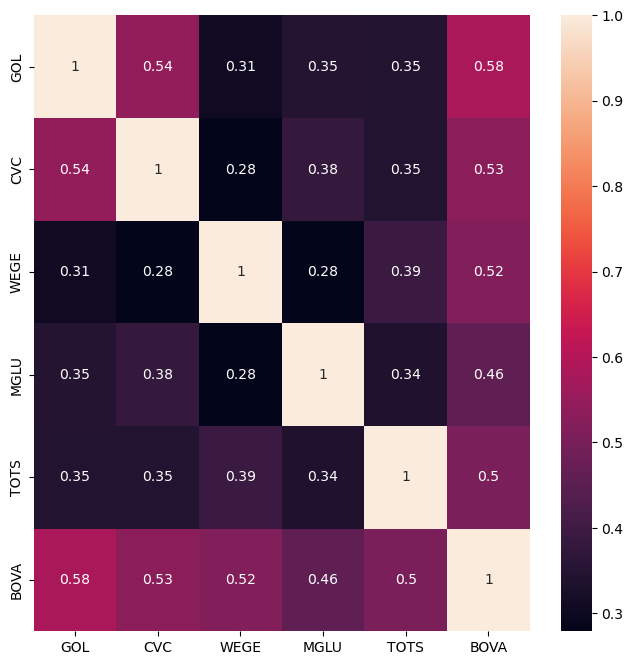

In [226]:
plt.figure(figsize=(8,8))
sns.heatmap(taxas_retorno.corr(), annot=True);

http://bvmf.bmfbovespa.com.br/indices/ResumoCarteiraQuadrimestre.aspx?Indice=IBOV&idioma=pt-br

[Summary](#Summary)

# 9. Analysing the Risk of a Portfolio <a id='AnaRiskPortfolio'></a>

## 9.1 Learning the Working Dataset

In [227]:
# Importing Python Modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
from scipy import stats

In [228]:
# Loading the working data set
dataset = pd.read_csv('acoes.csv')
dataset

,Date,GOL,CVC,WEGE,MGLU,TOTS,BOVA
0,2015-01-02,14.99,15.20,5.923076,0.232812,11.910702,47.259998
1,2015-01-05,14.85,15.00,5.963461,0.237187,11.544731,46.320000
2,2015-01-06,15.21,14.80,5.875000,0.234062,10.822770,46.580002
3,2015-01-07,14.55,14.67,5.807692,0.241875,10.746248,48.150002
4,2015-01-08,14.27,14.15,5.905769,0.240000,10.995774,48.509998
...,...,...,...,...,...,...,...
2173,2023-11-07,8.05,3.15,32.779999,1.770000,28.690001,115.669998
2174,2023-11-08,8.07,3.10,32.450001,1.780000,30.309999,115.519997
2175,2023-11-09,8.33,3.01,32.410000,1.710000,30.980000,115.180000
2176,2023-11-10,8.74,3.04,33.169998,1.800000,31.799999,117.010002


In [229]:
# Normalizing the working data set
# Make the values for each column of the first row equal 1 and divide the columns of the other rows by 
# the corresponding column of the first row
dataset_normalizado = dataset.copy()
for i in dataset_normalizado.columns[1:]:
    dataset_normalizado[i] = (dataset_normalizado[i] / dataset_normalizado[i][0])

dataset_normalizado

,Date,GOL,CVC,WEGE,MGLU,TOTS,BOVA
0,2015-01-02,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2015-01-05,0.990660,0.986842,1.006818,1.018792,0.969274,0.980110
2,2015-01-06,1.014676,0.973684,0.991883,1.005369,0.908659,0.985612
3,2015-01-07,0.970647,0.965132,0.980520,1.038928,0.902235,1.018832
4,2015-01-08,0.951968,0.930921,0.997078,1.030875,0.923184,1.026449
...,...,...,...,...,...,...,...
2173,2023-11-07,0.537025,0.207237,5.534286,7.602701,2.408758,2.447524
2174,2023-11-08,0.538359,0.203947,5.478572,7.645654,2.544770,2.444350
2175,2023-11-09,0.555704,0.198026,5.471819,7.344982,2.601022,2.437156
2176,2023-11-10,0.583055,0.200000,5.600130,7.731560,2.669868,2.475878


In [230]:
# Plotting the normalized data set
figura = px.line(title = 'Histórico do preço das ações')
for i in dataset_normalizado.columns[1:]:
    figura.add_scatter(x = dataset_normalizado['Date'], y = dataset_normalizado[i], name = i)
figura.show()

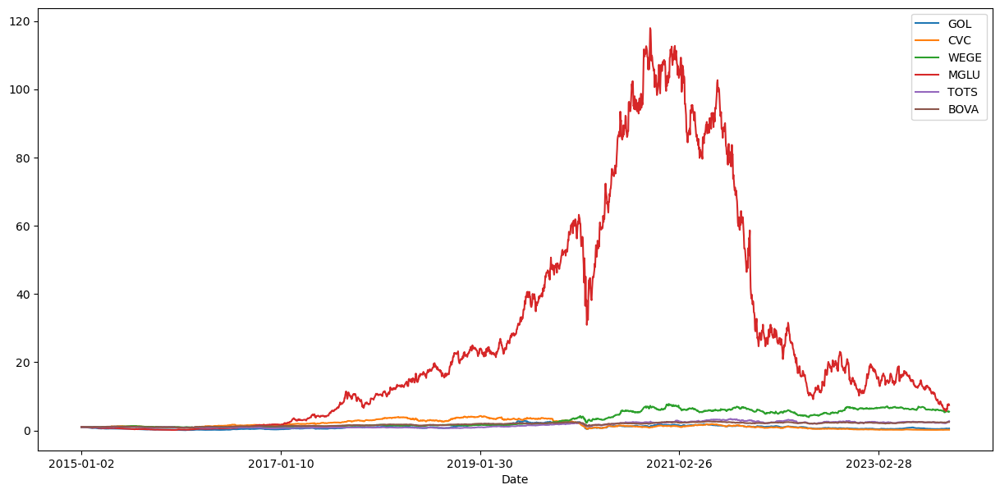

In [231]:
# Plotting the normalized dataset (zooming)
dataset_normalizado.plot(x = 'Date', figsize=(15,7));

## 9.2 Calculating Return Rates

In [232]:
dataset

,Date,GOL,CVC,WEGE,MGLU,TOTS,BOVA
0,2015-01-02,14.99,15.20,5.923076,0.232812,11.910702,47.259998
1,2015-01-05,14.85,15.00,5.963461,0.237187,11.544731,46.320000
2,2015-01-06,15.21,14.80,5.875000,0.234062,10.822770,46.580002
3,2015-01-07,14.55,14.67,5.807692,0.241875,10.746248,48.150002
4,2015-01-08,14.27,14.15,5.905769,0.240000,10.995774,48.509998
...,...,...,...,...,...,...,...
2173,2023-11-07,8.05,3.15,32.779999,1.770000,28.690001,115.669998
2174,2023-11-08,8.07,3.10,32.450001,1.780000,30.309999,115.519997
2175,2023-11-09,8.33,3.01,32.410000,1.710000,30.980000,115.180000
2176,2023-11-10,8.74,3.04,33.169998,1.800000,31.799999,117.010002


In [233]:
# Normalizing the working data set
# Make the values for each column of the first row equal 1 and divide the columns of the other rows by 
# the corresponding column of the first row
dataset_normalizado = dataset.copy()
for i in dataset_normalizado.columns[1:]:
    dataset_normalizado[i] = (dataset_normalizado[i] / dataset_normalizado[i][0])

dataset_normalizado

,Date,GOL,CVC,WEGE,MGLU,TOTS,BOVA
0,2015-01-02,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2015-01-05,0.990660,0.986842,1.006818,1.018792,0.969274,0.980110
2,2015-01-06,1.014676,0.973684,0.991883,1.005369,0.908659,0.985612
3,2015-01-07,0.970647,0.965132,0.980520,1.038928,0.902235,1.018832
4,2015-01-08,0.951968,0.930921,0.997078,1.030875,0.923184,1.026449
...,...,...,...,...,...,...,...
2173,2023-11-07,0.537025,0.207237,5.534286,7.602701,2.408758,2.447524
2174,2023-11-08,0.538359,0.203947,5.478572,7.645654,2.544770,2.444350
2175,2023-11-09,0.555704,0.198026,5.471819,7.344982,2.601022,2.437156
2176,2023-11-10,0.583055,0.200000,5.600130,7.731560,2.669868,2.475878


In [234]:
# Deleting the 'Date' column
dataset_normalizado_bkp = dataset_normalizado
dataset_normalizado.drop(labels='Date', axis=1, inplace=True)

In [235]:
dataset_normalizado

,GOL,CVC,WEGE,MGLU,TOTS,BOVA
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.990660,0.986842,1.006818,1.018792,0.969274,0.980110
2,1.014676,0.973684,0.991883,1.005369,0.908659,0.985612
3,0.970647,0.965132,0.980520,1.038928,0.902235,1.018832
4,0.951968,0.930921,0.997078,1.030875,0.923184,1.026449
...,...,...,...,...,...,...
2173,0.537025,0.207237,5.534286,7.602701,2.408758,2.447524
2174,0.538359,0.203947,5.478572,7.645654,2.544770,2.444350
2175,0.555704,0.198026,5.471819,7.344982,2.601022,2.437156
2176,0.583055,0.200000,5.600130,7.731560,2.669868,2.475878


## 9.2.1 Calculating the Daily Return

In [236]:
taxas_retorno_daily = (dataset_normalizado / dataset_normalizado.shift(1)) - 1
taxas_retorno_daily

,GOL,CVC,WEGE,MGLU,TOTS,BOVA
0,NaN,NaN,NaN,NaN,NaN,NaN
1,-0.009340,-0.013158,0.006818,0.018792,-0.030726,-0.019890
2,0.024242,-0.013333,-0.014834,-0.013175,-0.062536,0.005613
3,-0.043392,-0.008784,-0.011457,0.033380,-0.007070,0.033705
4,-0.019244,-0.035447,0.016887,-0.007752,0.023220,0.007477
...,...,...,...,...,...,...
2173,-0.013480,0.067797,-0.012948,0.237762,0.035740,0.007491
2174,0.002484,-0.015873,-0.010067,0.005650,0.056466,-0.001297
2175,0.032218,-0.029032,-0.001233,-0.039326,0.022105,-0.002943
2176,0.049220,0.009967,0.023450,0.052632,0.026469,0.015888


## 9.2.2 Calculating the Volatility of a Portfolio

In [237]:
# Calculating the annual return
portfolio_annual_return = (taxas_retorno_daily.mean() * 246) * 100
portfolio_annual_return

GOL     22.144803
CVC      0.358383
WEGE    25.199297
MGLU    45.101748
TOTS    18.856402
BOVA    13.418700
dtype: float64

In [238]:
# Calculating the daily return
taxas_retorno_daily

,GOL,CVC,WEGE,MGLU,TOTS,BOVA
0,NaN,NaN,NaN,NaN,NaN,NaN
1,-0.009340,-0.013158,0.006818,0.018792,-0.030726,-0.019890
2,0.024242,-0.013333,-0.014834,-0.013175,-0.062536,0.005613
3,-0.043392,-0.008784,-0.011457,0.033380,-0.007070,0.033705
4,-0.019244,-0.035447,0.016887,-0.007752,0.023220,0.007477
...,...,...,...,...,...,...
2173,-0.013480,0.067797,-0.012948,0.237762,0.035740,0.007491
2174,0.002484,-0.015873,-0.010067,0.005650,0.056466,-0.001297
2175,0.032218,-0.029032,-0.001233,-0.039326,0.022105,-0.002943
2176,0.049220,0.009967,0.023450,0.052632,0.026469,0.015888


In [239]:
# Print the dataset column names
dataset.columns

Index(['Date', 'GOL', 'CVC', 'WEGE', 'MGLU', 'TOTS', 'BOVA'], dtype='object')

In [240]:
# Set weights for the portfolio's stocks
weights1 = np.array([0.2, 0.2, 0.2, 0.2, 0.2, 0.0])

In [241]:
weights1.sum()

1.0

In [242]:
# Calculating the covariance for the daily returns
annual_covariance_return = taxas_retorno_daily.cov() * 246
annual_covariance_return

,GOL,CVC,WEGE,MGLU,TOTS,BOVA
GOL,0.576726,0.252688,0.079874,0.178406,0.101104,0.111453
CVC,0.252688,0.374273,0.058393,0.156170,0.081447,0.081818
WEGE,0.079874,0.058393,0.117161,0.065110,0.051641,0.044502
MGLU,0.178406,0.156170,0.065110,0.456862,0.088719,0.078006
TOTS,0.101104,0.081447,0.051641,0.088719,0.148611,0.048714
BOVA,0.111453,0.081818,0.044502,0.078006,0.048714,0.063342


In [243]:
# Annual covariance return x Weights
np.dot(annual_covariance_return, weights1)

array([0.23775965, 0.18459401, 0.07443556, 0.18905362, 0.09430444,
       0.07289863])

In [244]:
# Calculating the portfolio's variance
variancia_portfolio1 = np.dot(weights1, np.dot(annual_covariance_return, weights1))
variancia_portfolio1

0.15602945451267808

In [245]:
# Calculating the portfolio's volatility
volatilidade_portfolio1 = math.sqrt(variancia_portfolio1)
volatilidade_portfolio1

0.39500563858339804

In [246]:
# Set weights for BOVA
weights2 = np.array([0.0, 0.0, 0.0, 0.0, 0.0, 1.0])

In [247]:
# Calculating variance for BOVA
variancia_portfolio2 = np.dot(weights2, np.dot(taxas_retorno.cov() * 246, weights2))
variancia_portfolio2

0.06334191034288109

In [248]:
# Calculating volatility for BOVA
volatilidade_portfolio2 = math.sqrt(variancia_portfolio2)
volatilidade_portfolio2

0.25167818805546316

[Summary](#Summary)

# 10. Systematic and non-Systematic Risk <a id='SystemRiskAndNonSystemRisk'></a>

- Risco sistemático: mudança diária no preço das ações, devido a eventos como recessão da economia, comportamento do cliente (eventos externos). Não pode ser eliminado e pode afetar todas as empresas
- Risco não sistemático: Eventos específicos na empresa (depende do tipo de empresa)
    
- Systematic risk: Daily changes in stock prices due to events such as economic recession, consumer behavior (external events). It cannot be eliminated and can affect all companies.
- Non-systematic risk: Specific events within the company (depends on the type of company).

In [249]:
taxas_retorno_daily

,GOL,CVC,WEGE,MGLU,TOTS,BOVA
0,NaN,NaN,NaN,NaN,NaN,NaN
1,-0.009340,-0.013158,0.006818,0.018792,-0.030726,-0.019890
2,0.024242,-0.013333,-0.014834,-0.013175,-0.062536,0.005613
3,-0.043392,-0.008784,-0.011457,0.033380,-0.007070,0.033705
4,-0.019244,-0.035447,0.016887,-0.007752,0.023220,0.007477
...,...,...,...,...,...,...
2173,-0.013480,0.067797,-0.012948,0.237762,0.035740,0.007491
2174,0.002484,-0.015873,-0.010067,0.005650,0.056466,-0.001297
2175,0.032218,-0.029032,-0.001233,-0.039326,0.022105,-0.002943
2176,0.049220,0.009967,0.023450,0.052632,0.026469,0.015888


## 10.1 Systematic Risk for Portfolio's Stocks

In [250]:
weights1

array([0.2, 0.2, 0.2, 0.2, 0.2, 0. ])

In [251]:
taxas_retorno_daily.var() * 246

GOL     0.576726
CVC     0.374273
WEGE    0.117161
MGLU    0.456862
TOTS    0.148611
BOVA    0.063342
dtype: float64

In [252]:
variancia_pesos1 = (taxas_retorno_daily.var() * 246) * weights1
variancia_pesos1

GOL     0.115345
CVC     0.074855
WEGE    0.023432
MGLU    0.091372
TOTS    0.029722
BOVA    0.000000
dtype: float64

In [253]:
sub1 = 0
for i in range(0, len(variancia_pesos1)):
    sub1 -= variancia_pesos1[i]
sub1

-0.3347265332287585

In [254]:
sub1 = - variancia_pesos1[0] - variancia_pesos1[1] - variancia_pesos1[2] - variancia_pesos1[3] - variancia_pesos1[4] - variancia_pesos1[5] 
sub1

-0.3347265332287585

In [255]:
variancia_portfolio1

0.15602945451267808

In [256]:
risco_nao_sistematico1 = (variancia_portfolio1 - sub1)
risco_nao_sistematico1

0.4907559877414366

## 10.2 Systematic Risk for Portfolio's Index (BOVA)

In [257]:
weights2

array([0., 0., 0., 0., 0., 1.])

In [258]:
taxas_retorno_daily.var() * 246

GOL     0.576726
CVC     0.374273
WEGE    0.117161
MGLU    0.456862
TOTS    0.148611
BOVA    0.063342
dtype: float64

In [259]:
variancia_pesos2 = (taxas_retorno_daily.var() * 246) * weights2
variancia_pesos2

GOL     0.000000
CVC     0.000000
WEGE    0.000000
MGLU    0.000000
TOTS    0.000000
BOVA    0.063342
dtype: float64

In [260]:
sub2 = 0
for i in range(0, len(variancia_pesos2)):
    sub2 -= variancia_pesos2[i]
sub2

-0.06334191034288117

In [261]:
variancia_portfolio2

0.06334191034288109

In [262]:
risco_nao_sistematico2 = (variancia_portfolio2 - sub2)
risco_nao_sistematico2

0.12668382068576226

# 11. Analysing Portfolio AMBEV, ODONTOPREV, VIVO, PETROBRAS, BBRASIL, BOVA <a id='PorfolioExerc'></a>

In [263]:
dataset = pd.read_csv('acoes_ex.csv')
dataset

,Date,AMBEV,ODONTOPREV,VIVO,PETROBRAS,BBRASIL,BOVA
0,2015-01-02,16.020000,9.37,37.820000,9.000000,22.650000,47.259998
1,2015-01-05,15.730000,9.62,37.070000,8.270000,22.180000,46.320000
2,2015-01-06,16.330000,9.55,36.150002,8.060000,22.490000,46.580002
3,2015-01-07,16.559999,9.69,37.389999,8.450000,23.480000,48.150002
4,2015-01-08,16.540001,9.66,38.910000,9.020000,23.559999,48.509998
...,...,...,...,...,...,...,...
2201,2023-11-08,13.540000,12.10,49.570000,36.759998,51.669998,115.519997
2202,2023-11-09,13.410000,11.85,49.509998,37.540001,49.509998,115.180000
2203,2023-11-10,13.350000,11.94,50.099998,37.419998,50.240002,117.010002
2204,2023-11-13,13.430000,11.82,50.660000,38.259998,50.049999,116.820000


In [264]:
dataset.drop(labels=['Date'], axis = 1, inplace = True)
dataset

,AMBEV,ODONTOPREV,VIVO,PETROBRAS,BBRASIL,BOVA
0,16.020000,9.37,37.820000,9.000000,22.650000,47.259998
1,15.730000,9.62,37.070000,8.270000,22.180000,46.320000
2,16.330000,9.55,36.150002,8.060000,22.490000,46.580002
3,16.559999,9.69,37.389999,8.450000,23.480000,48.150002
4,16.540001,9.66,38.910000,9.020000,23.559999,48.509998
...,...,...,...,...,...,...
2201,13.540000,12.10,49.570000,36.759998,51.669998,115.519997
2202,13.410000,11.85,49.509998,37.540001,49.509998,115.180000
2203,13.350000,11.94,50.099998,37.419998,50.240002,117.010002
2204,13.430000,11.82,50.660000,38.259998,50.049999,116.820000


In [265]:
taxas_retorno = (dataset / dataset.shift(1)) - 1
taxas_retorno

,AMBEV,ODONTOPREV,VIVO,PETROBRAS,BBRASIL,BOVA
0,NaN,NaN,NaN,NaN,NaN,NaN
1,-0.018102,0.026681,-0.019831,-0.081111,-0.020751,-0.019890
2,0.038144,-0.007276,-0.024818,-0.025393,0.013977,0.005613
3,0.014084,0.014660,0.034301,0.048387,0.044020,0.033705
4,-0.001208,-0.003096,0.040653,0.067456,0.003407,0.007477
...,...,...,...,...,...,...
2201,-0.002211,0.037736,0.031848,-0.023639,0.012740,-0.001297
2202,-0.009601,-0.020661,-0.001210,0.021219,-0.041804,-0.002943
2203,-0.004474,0.007595,0.011917,-0.003197,0.014745,0.015888
2204,0.005993,-0.010050,0.011178,0.022448,-0.003782,-0.001624


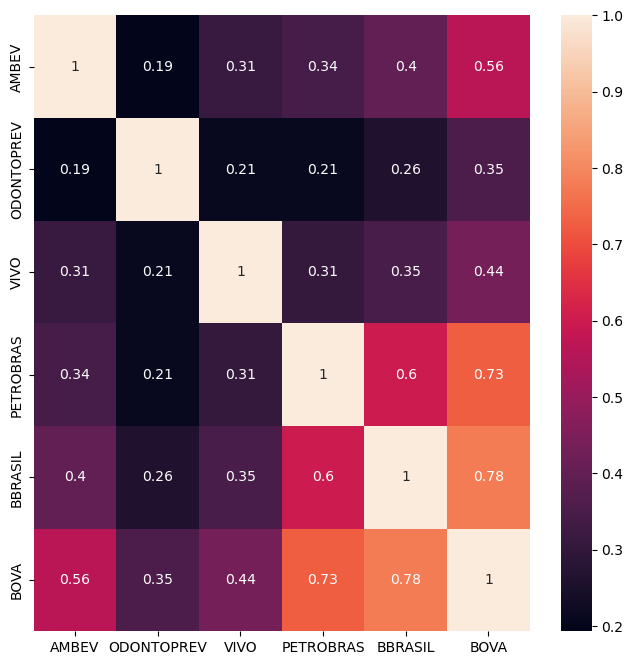

In [266]:
plt.figure(figsize=(8,8))
sns.heatmap(taxas_retorno.corr(), annot=True);

In [267]:
# Calculating the risk for each stock in the portfolio
taxas_retorno.std() * math.sqrt(246) # Anualization

AMBEV         0.267109
ODONTOPREV    0.320208
VIVO          0.288104
PETROBRAS     0.493337
BBRASIL       0.420039
BOVA          0.251367
dtype: float64

## 11.1 Systematic Risk for Portfolio's Stocks

In [268]:
pesos1 = np.array([0.2, 0.2, 0.2, 0.2, 0.2, 0.0])

In [269]:
variancia_portfolio1 = np.dot(pesos1, np.dot(taxas_retorno.cov() * 246, pesos1))
variancia_portfolio1

0.0612304119984378

In [270]:
volatidade_portfolio1 = math.sqrt(variancia_portfolio1)
volatidade_portfolio1

0.24744779651158302

In [271]:
variancia_acoes1 = (taxas_retorno.var() * 246) * pesos1
sub = variancia_acoes1[0] - variancia_acoes1[1] - variancia_acoes1[2] - variancia_acoes1[3] - variancia_acoes1[4] - variancia_acoes1[5] 
risco_nao_sistematico1 = (variancia_portfolio1 - sub)
risco_nao_sistematico1

0.1680311007381372

## 11.2 Systematic Risk for Portfolio's Index (BOVA)

In [272]:
pesos2 = np.array([0.0, 0.0, 0.0, 0.0, 0.0, 1.0])

In [273]:
variancia_portfolio2 = np.dot(pesos2, np.dot(taxas_retorno.cov() * 246, pesos2))
variancia_portfolio2

0.06318534166178241

In [274]:
volatidade_portfolio2 = math.sqrt(np.dot(pesos2, np.dot(taxas_retorno.cov() * 246, pesos2)))
volatidade_portfolio2

0.2513669462395213

In [275]:
variancia_acoes2 = (taxas_retorno.var() * 246) * pesos2
sub = variancia_acoes2[0] - variancia_acoes2[1] - variancia_acoes2[2] - variancia_acoes2[3] - variancia_acoes2[4] - variancia_acoes2[5] 
risco_nao_sistematico2 = (variancia_portfolio2 - sub)
risco_nao_sistematico2

0.126370683323565